# Roofline Plot


Parameters:
* Compiler: `g++ 4.9.4`
* Compiler flags: `-O3 -std=c++11 -march=native`
* CPU: `Core i7-6820HQ Skylake, 2.7GHz`

In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np

mpl.rcParams['figure.figsize'] = (8.1, 5)
mpl.rcParams['figure.dpi'] = 600
mpl.rcParams['font.family'] = 'Roboto'
mpl.rcParams['font.size'] = 15

In [2]:
N = 200
D = 28*28
d = 2
T = 1000


bandwidth = 7917e6   # Bytes/s
freq = 2.7e9          # Cycles/s
beta = bandwidth/freq # bytes/cycle
pi = 4                # flops/cycle
data_type = "double"

print(f"beta:\t{beta:.2f} bytes/cycle")
print(f"pi:\t{pi} flops/cycle")

def check_bound(I):
    if I < pi / beta:
        print("Memory Bound")
    else:
        print("Compue bound")
        
size = 8 if data_type == "double" else 4

beta:	2.93 bytes/cycle
pi:	4 flops/cycle


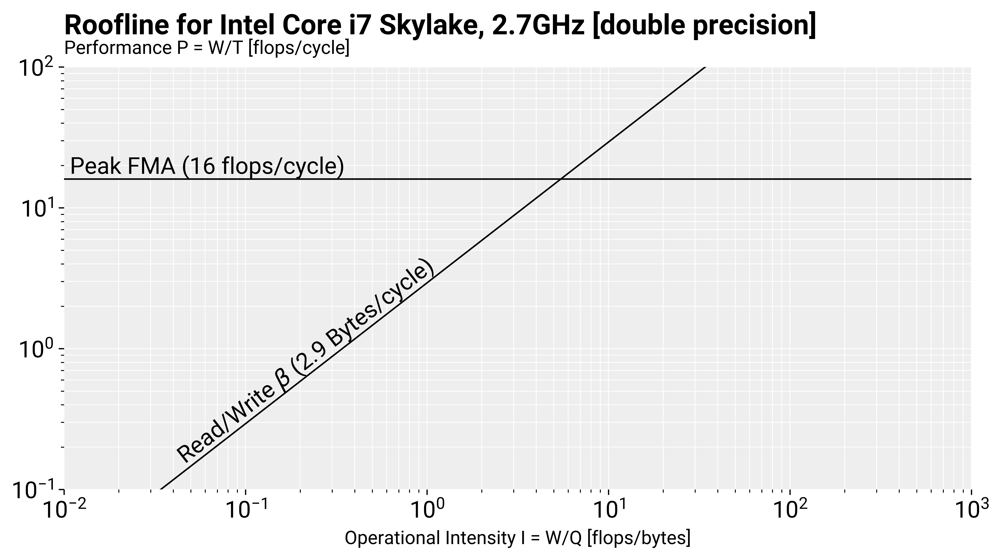

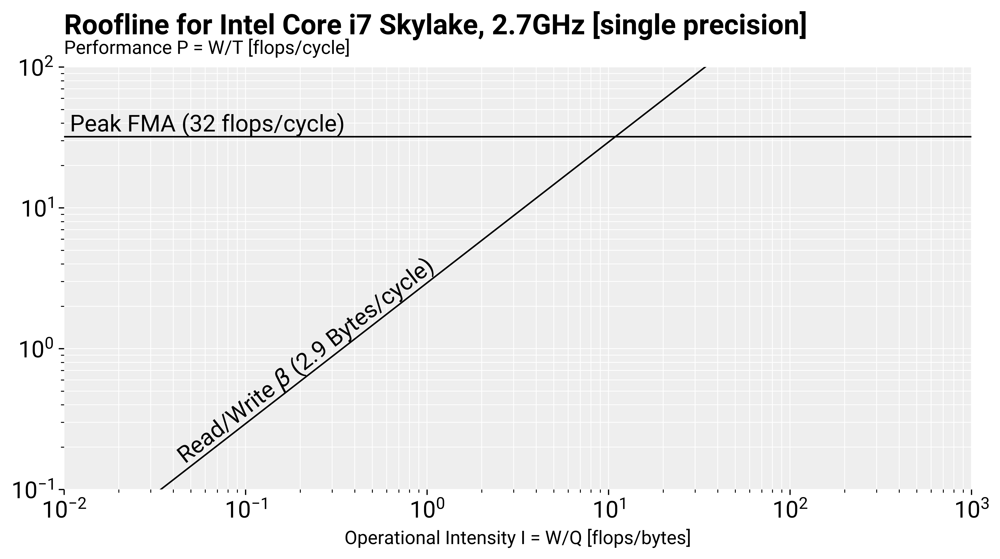

In [3]:
def roofline_plot(pi, beta, title=None):
    xlabel = "Operational Intensity I = W/Q [flops/bytes]"
    ylabel = "Performance P = W/T [flops/cycle]"
    x_min, x_max = 1E-2, 1E3
    y_min, y_max = 1E-1, 1E2

    ticks_2 = [2**i for i in range(-10, 10)]

    x = np.logspace(-3, 5, 1000)
    y = x*beta
    #y = np.fmin(np.log2(pi), x**beta)

    def two_powers(x, pos):
        if x >= 0:
            return f"{2**x:.0f}"
        else:
            return f"1/{2**-x:.0f}"


    fig = plt.figure()
    if title:
        fig.suptitle(title, fontweight='bold', x=0, ha='left')
    ax = fig.add_subplot(111)
    fig.subplots_adjust(top=.88, left=0, right=1)

    ax.yaxis.grid(which="both", color='#ffffff', linestyle='-', linewidth=.5)
    ax.xaxis.grid(which="both", color='#ffffff', linestyle='-', linewidth=.5)
    ax.set_facecolor('#eeeeee')

    ax.loglog(x, y, c="k", linewidth=1)
    ax.hlines(pi, x_min, x_max, colors="k", linewidth=1)
    ax.text(x_min, pi, f" Peak FMA ({pi:.0f} flops/cycle)", ha="left", va="bottom")
    pos_x = .04
    ax.text(pos_x, pos_x*beta*1.2, f"Read/Write $\\beta$ ({beta:.1f} Bytes/cycle)", 
            rotation=np.arctan(1)/np.pi*180-7, 
            va="bottom", ha="left")

    ax.set_xlim([x_min, x_max])
    ax.set_ylim([y_min, y_max])

    fontsize = 12
    ax.set_xlabel(xlabel, fontsize=fontsize)
    ax.set_title(ylabel, fontsize=fontsize, position=(0,1.0), ha='left', va='bottom')
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

    return ax

title = "Roofline for Intel Core i7 Skylake, 2.7GHz [double precision]"
roofline_plot(4*pi, beta, title=title)
plt.show()

title = "Roofline for Intel Core i7 Skylake, 2.7GHz [single precision]"
roofline_plot(8*pi, beta, title=title)
plt.show()

In [4]:
from util_tsne_exact import FUNCTION_NAMES, read_benchmark_exact

N, total_flops_ex, flops_by_function_ex, cycles_ex = read_benchmark_exact(
    "../implementations/tsne_exact_optimizations/benchmarking/20170503_121229@-O3 -march=native -std=c++11@double@",
    stop=3000)

In [5]:
Q = {
    "normalize": (N + 1) * D,
    "compute_pairwise_affinity_perplexity": (N * D + N**2) + 2 * N**2,
    "symmetrize_affinities": N**2,
    "early_exageration": N**2,
    "compute_low_dimensional_affinities": N**2 + (N * d + N**2),
    "gradient_computation": N * d + N**2 + N**2 + N*d,
    "gradient_update": N*d + N*d + N*d,
    "normalize_2": N*d + d
}

In [6]:
I = dict()

for i, fun in enumerate(FUNCTION_NAMES):
    I[fun] = flops_by_function_ex[:,i]/(size*Q[fun])
    if i >= 4: 
        I[fun] /= T

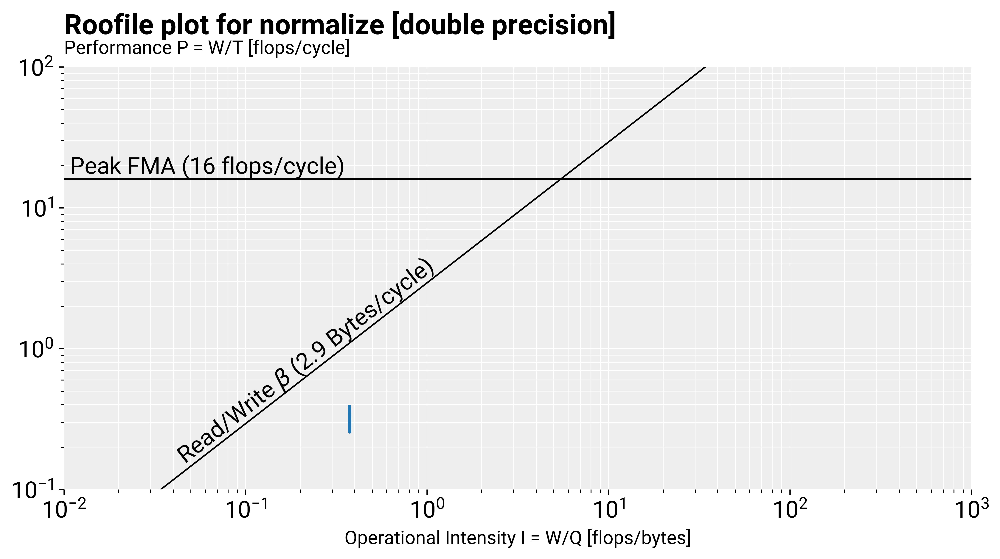

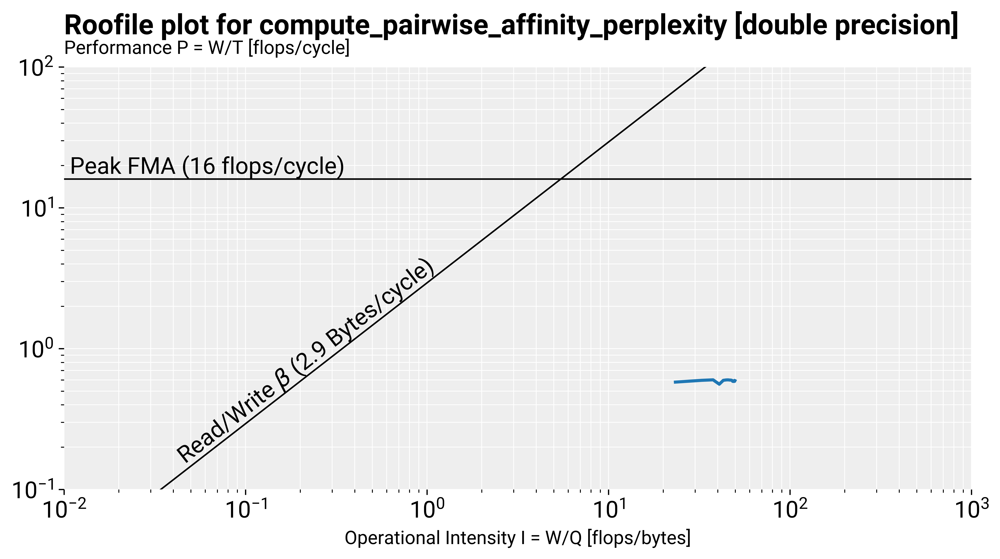

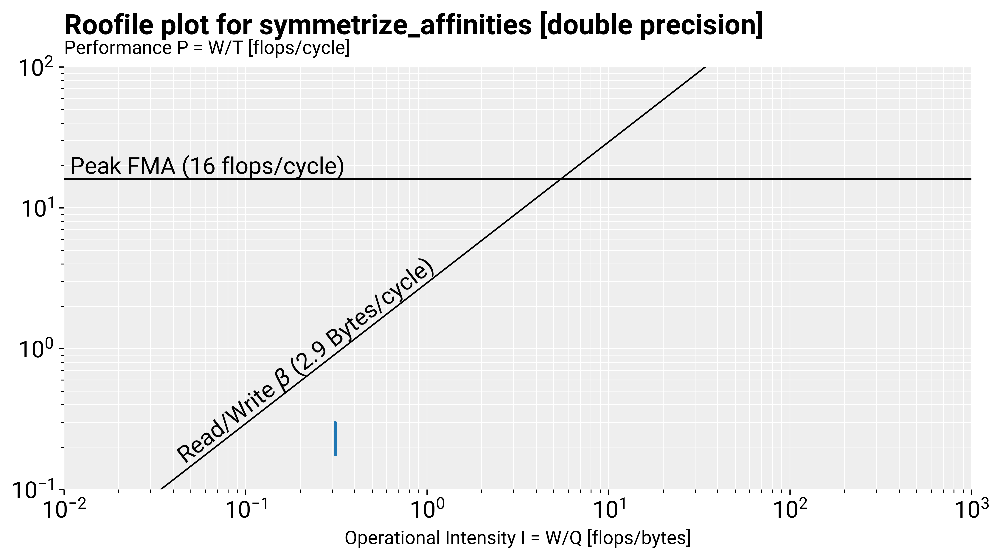

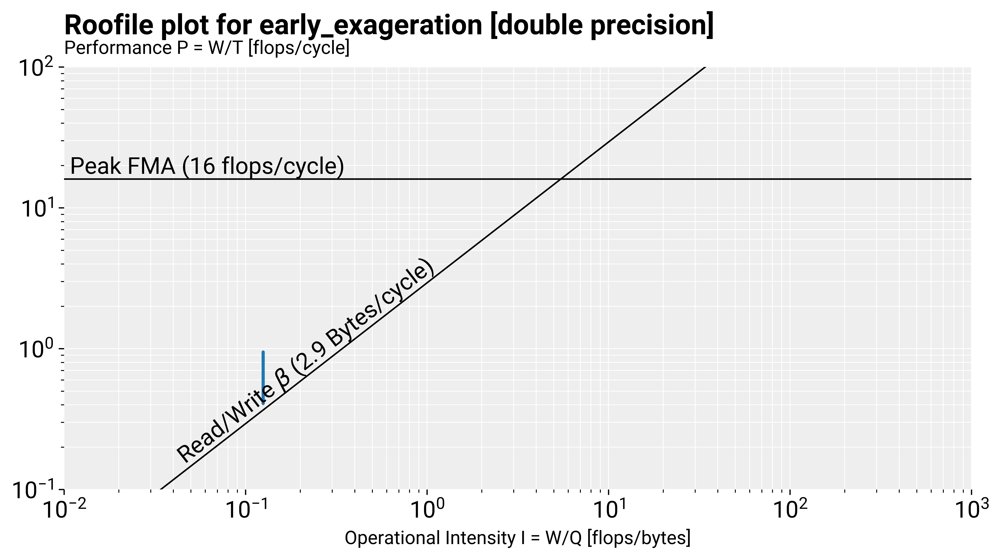

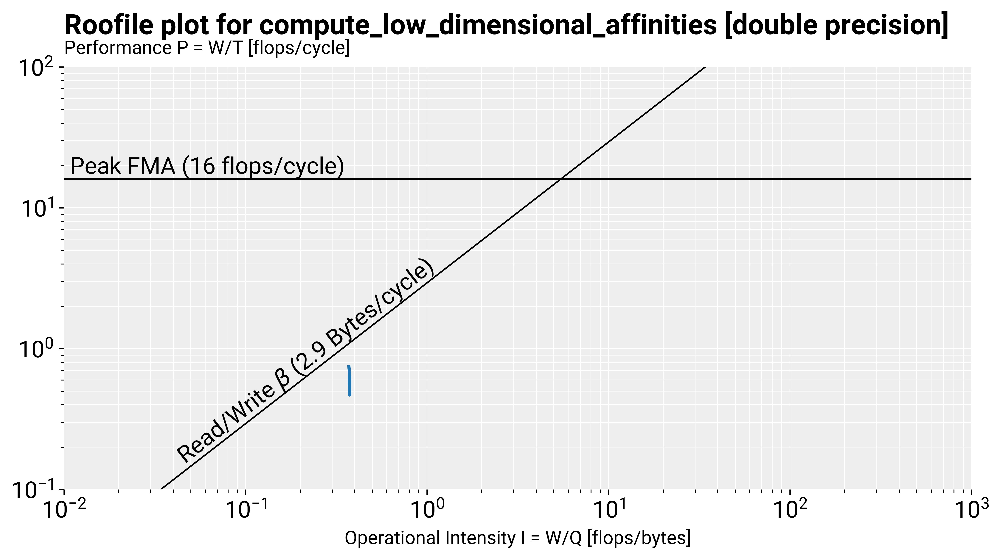

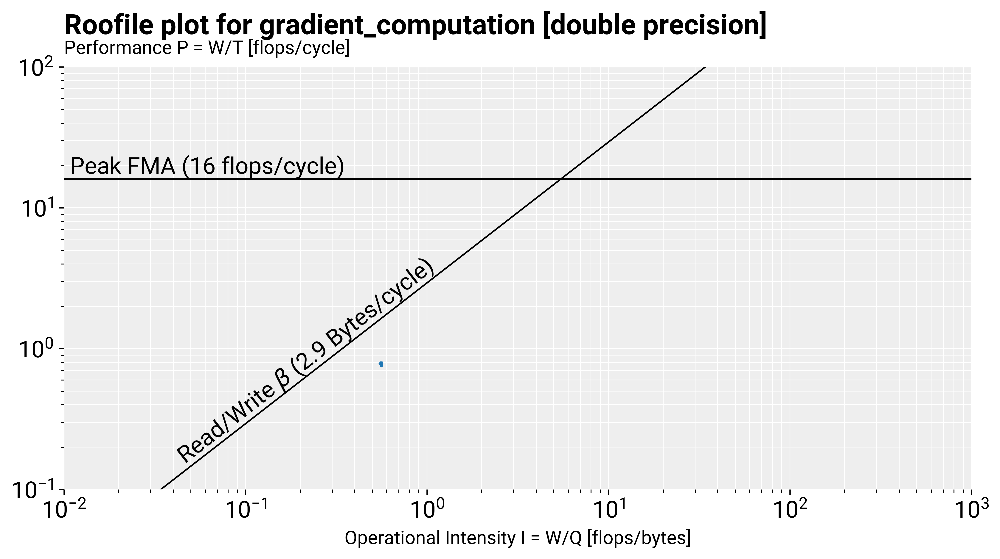

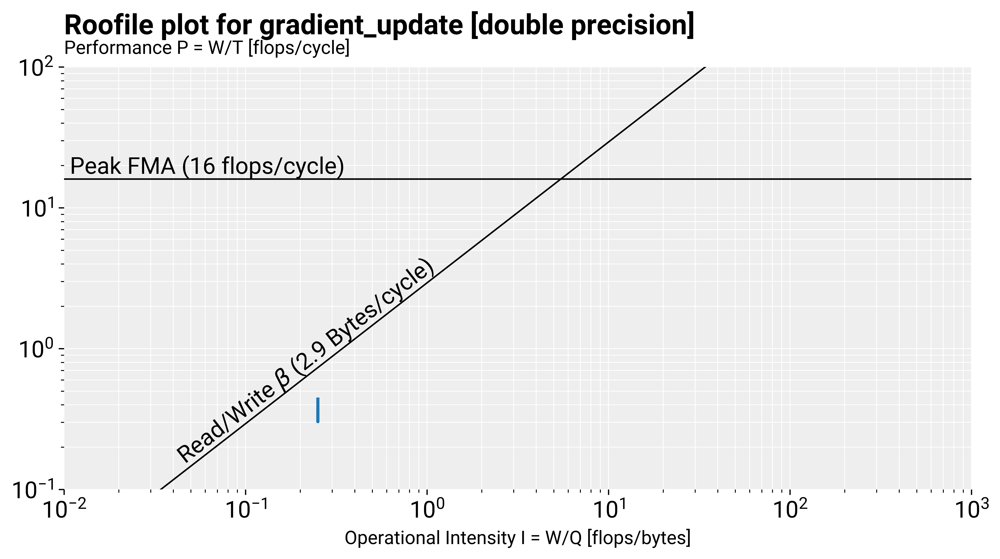

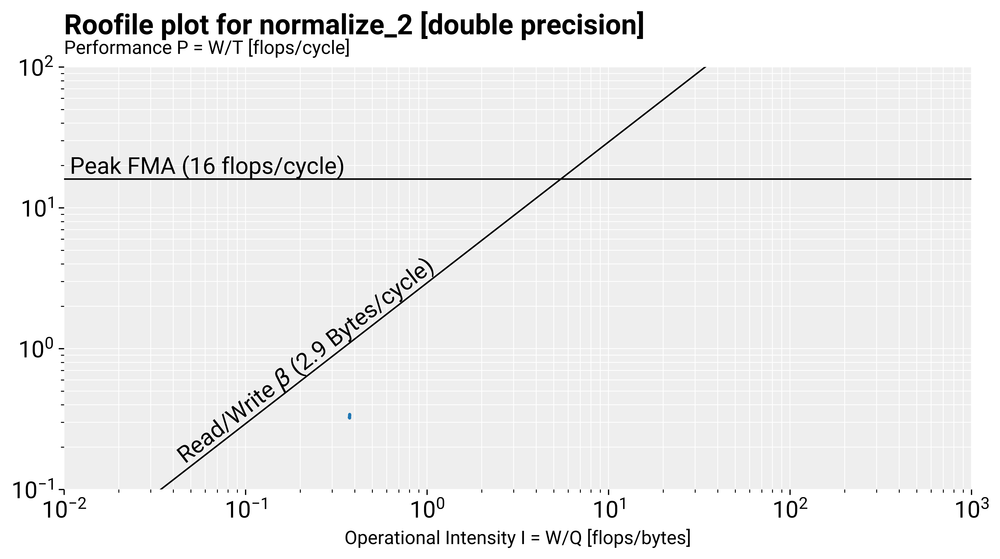

In [7]:
for i, function_name in enumerate(FUNCTION_NAMES):
    title = f"Roofile plot for {function_name} [double precision]"
    perf = flops_by_function_ex[:,i]/cycles_ex[:,i]

    Q_i = Q[function_name]
    I = flops_by_function_ex[:,i] / (size * Q_i)
    if i >= 4:
        I /= T
    if i == 3:
        I /= 2 # It is only called twice this function so the flops should be divided by 2
    
    
    ax = roofline_plot(pi*4, beta, title=title)
    ax.plot(I, perf, linewidth=2)
    plt.show()

In [8]:
N, total_flops_float_ex, flops_by_function_float_ex, cycles_float_ex = read_benchmark_exact(
    "../implementations/tsne_exact_optimizations/benchmarking/20170503_121229@-O3 -march=native -std=c++11@float@",
    stop=3000)

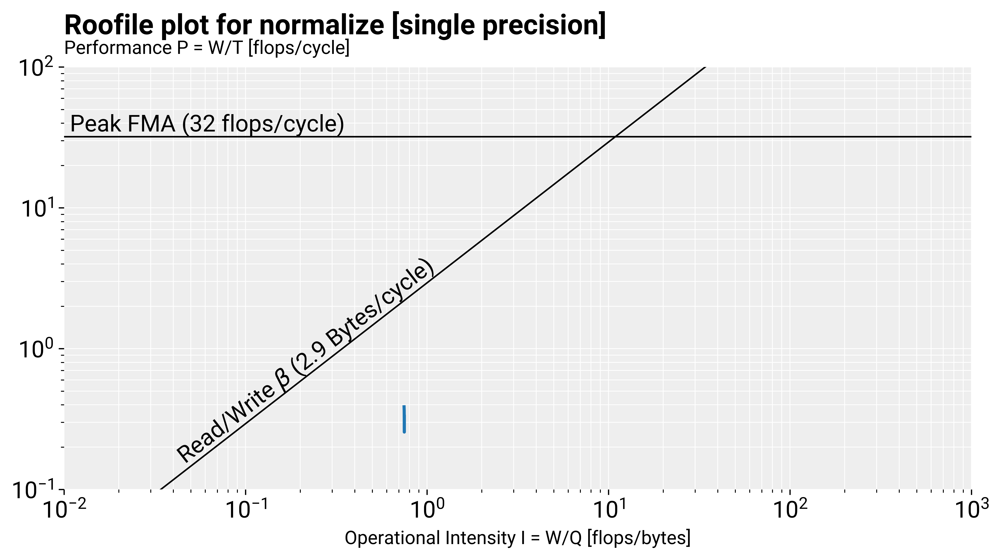

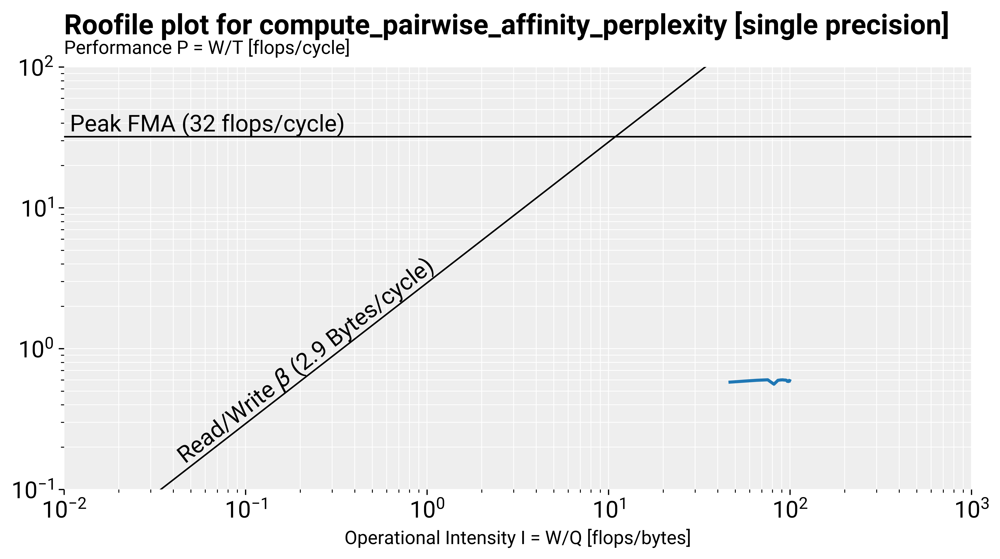

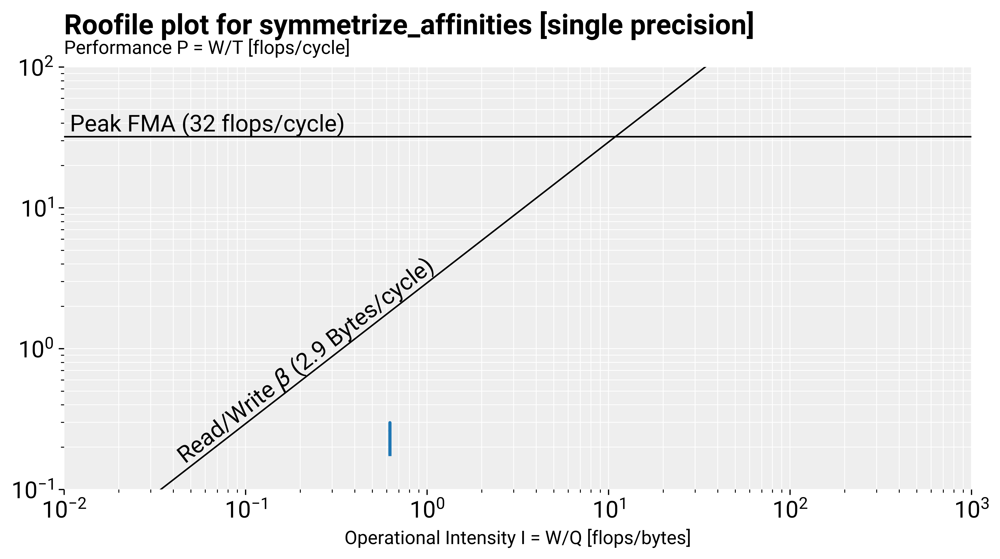

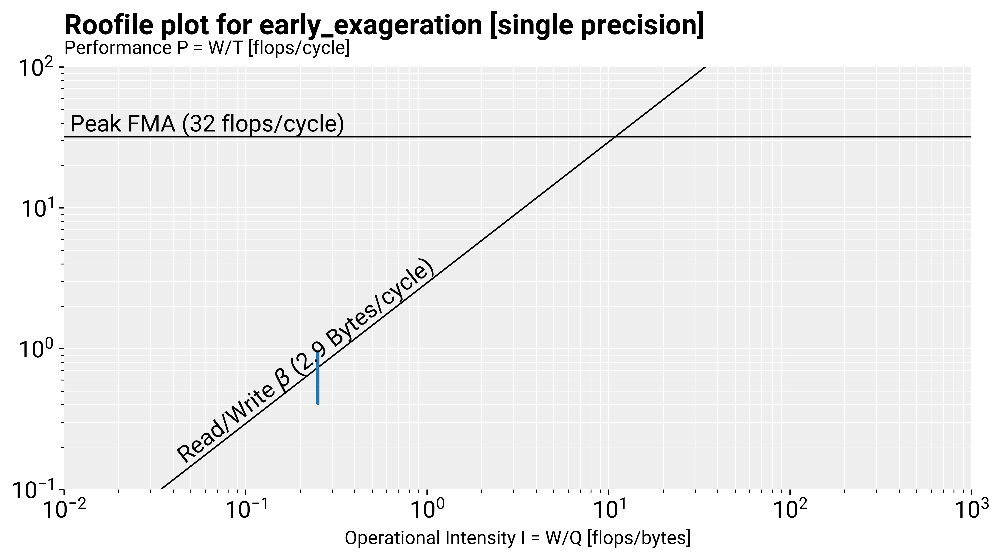

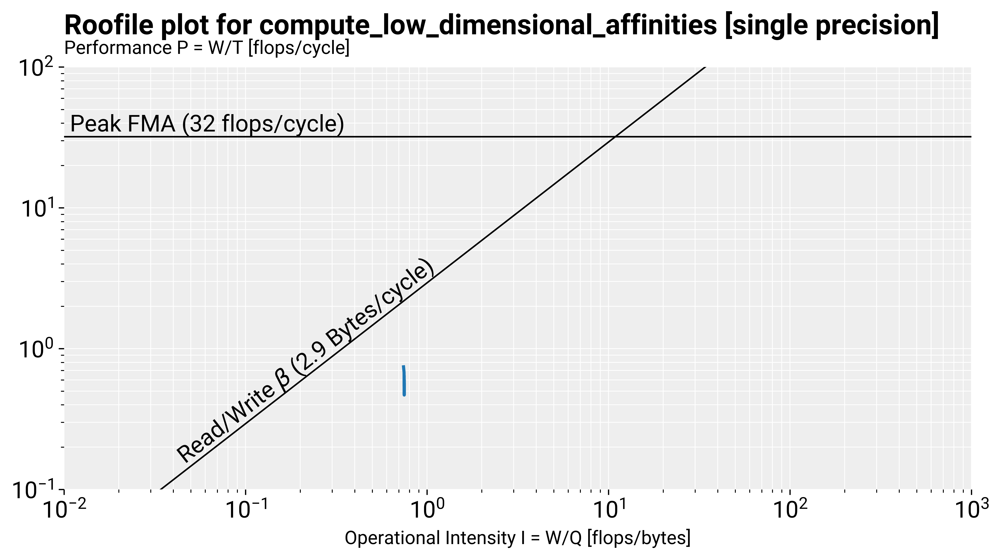

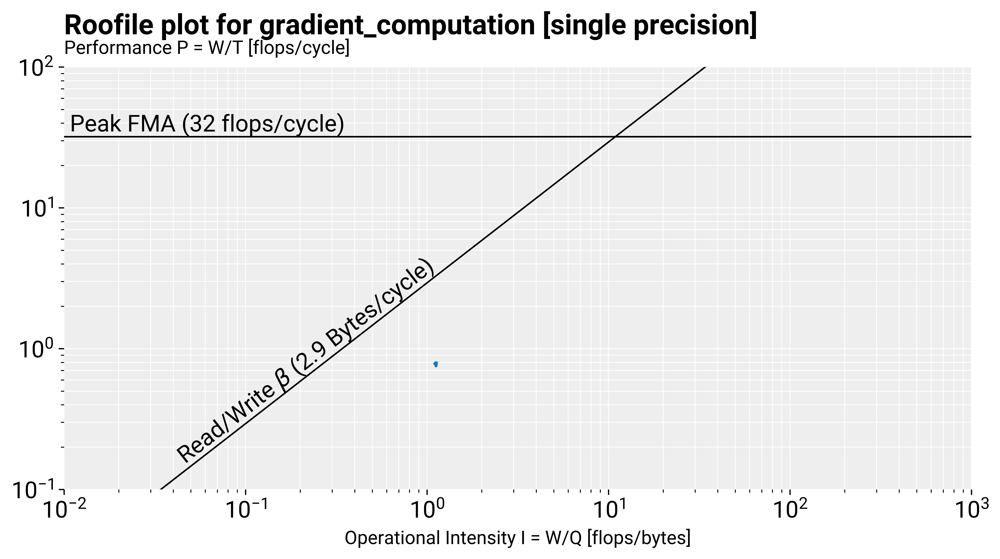

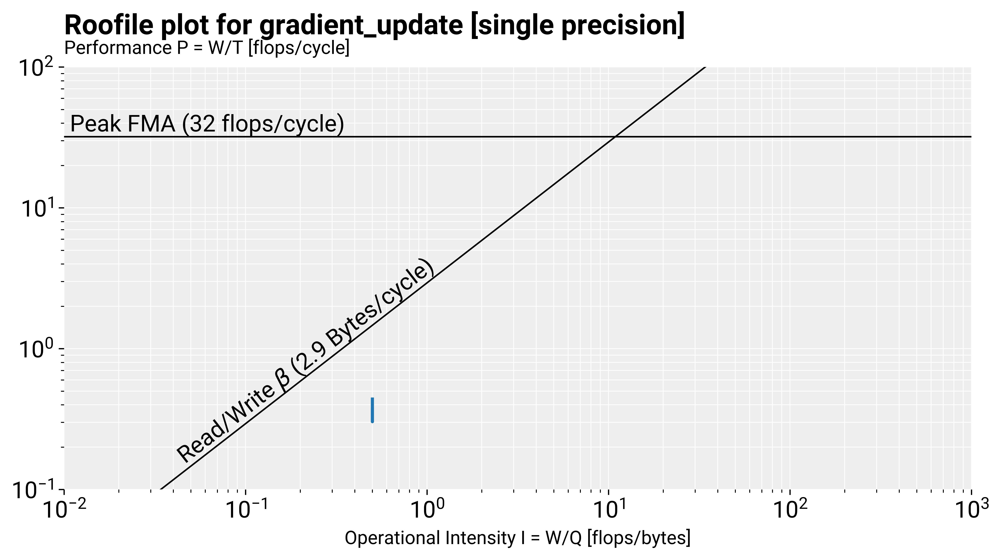

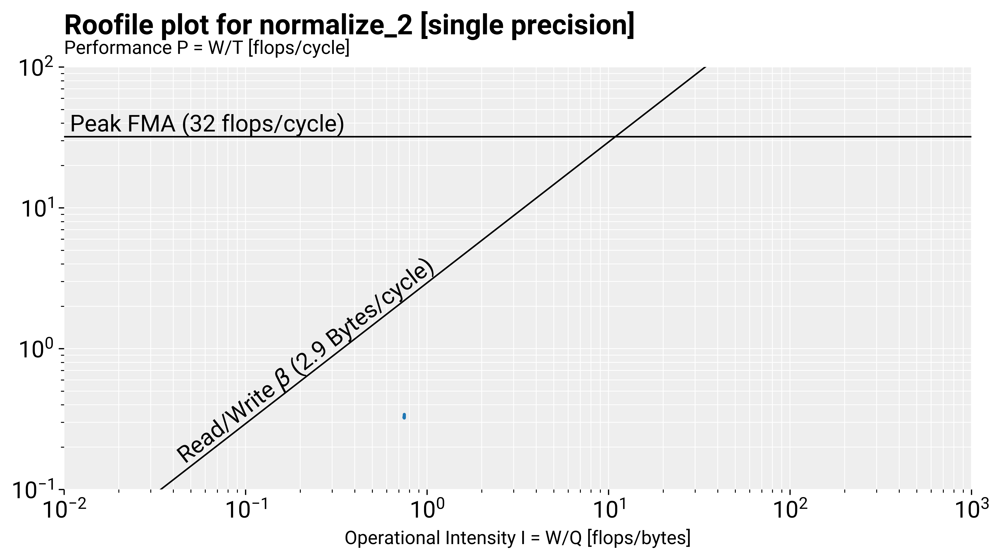

In [9]:
for i, function_name in enumerate(FUNCTION_NAMES):
    title = f"Roofile plot for {function_name} [single precision]"
    perf = flops_by_function_float_ex[:,i]/cycles_ex[:,i]

    Q_i = Q[function_name]
    I = flops_by_function_float_ex[:,i] / (4 * Q_i)
    if i >= 4:
        I /= T
    if i == 3:
        I /= 2 # It is only called twice this function so the flops should be divided by 2
    
    
    ax = roofline_plot(pi*8, beta, title=title)
    ax.plot(I, perf, linewidth=2)
    plt.show()